<img src="https://storage.googleapis.com/arize-assets/arize-logo-white.jpg" width="200"/>

# Getting Started with the Arize Platform - Recommendation Systems

**In this walkthrough, we are going to monitor and investigate performance of a recommendation system recently pushed into production.**

In this walkthrough you will be taking on the persona of a machine learning engineer for a premium music service. After spending a great deal of time collecting customer data, training and testing various models your team has built a ML-powered recommendation engine to give your listeners personalized playlist recommendations based on their most listened to songs on their sound cloud. You are now ready to push your model into production and monitor how your recommendations are received by your user. With Arize you have the ability to monitor the performance of your model in production and compare it to your selected baseline. 

In this use case you will have the opportunity to:
1. Explore the decisions made by your recommendation with Arize explainability features
2. Monitor feature drift happening in real-time as a user's music preference changes 
3. Surface drift, data quality, data consistency issues to perform a root cause analysis 
4. Triage the impactful features that lead to drift 
5. Make proactive decisions to negate model degradation

 



**Dataset Generation**

The [Top 5000 Albums of All Time](https://www.kaggle.com/michaelbryantds/top-5000-albums-of-all-time-rateyourmusiccom) dataset contains 5000 ranked albums including ranking, album name, artist name, release date, genres, descriptors, average rating, number of ratings, and number of reviews. The dataset was acquired via web scraping on 12 October 2021 and decided by vote from the users of [rateyourmusic.com](rateyourmusic.com). 
Although we will not be using this full dataset directly, we will be using the album name, artist name, release date, genres to generate user recommendations.

Once your models are deployed into production, ML Observability provides deep understanding of your model’s performance, and root causing exactly why it’s behaving in certain ways. The Arize platform logs model inferences across training, validation and production environments without needing to store nor serve your models.  

The inferences for this use case are the probabilities the user will play the recommended song. Once the recommendations are made for each user, the ground truth collected is an indicator as to whether or not the user listened to the song (or skipped the song) —represented as 0 (skipped) or 1 (played). 

For example:

Recommended Song  | Outcome     | Actual Score
-----------------------|---------------------|------------------
Livin' On A Prayer BY Bon Jovi                 | User skipped song   | 0
Paradise City BY Guns N' Roses                   | User listened to song         | 1
Creep (Explicit) BY Radiohead                   | User skipped song   | 0

For a recommendation system will be using precision as our default performance metric to monitor model performance since precision is about retrieving the best items to the user (assuming that there are more useful items available).

Precision is the number of selected items that are relevant. So suppose our recommender system selects 3 items to recommend to users out of which 2 are relevant then precision will be 66%. 

See equation: 

$$Precision = \frac{TP}{TP+FP}$$

TP = song recommended + song played

FP = song recommended + song not played




## **Recommendation Engines**

Recommendation engines are more than a way of rearranging information available about user preferences and then using this information to provide informed recommendations on the basis of that information, it is a critical piece of thousands of core business models. If the recommendation systems in your company drift over time, user satisfaction, engagement will decrease, while churn and distrust in your company will increase. Having recommendations that are dynamic, adaptable and explainable are key to customer success and the success of a company's core business model. In this notebook we will utilize the user-song play count dataset to uncover different ways in which we can recommend new tracks to different users and then monitor the performance of our model in Arize.




# Step 0. Setup and Getting the Data
The first step is to load pre-existing datasets for training, validation and prediction into the colab notebook from your data source. 



## Install Dependencies and Import Libraries 📚

In [ ]:
!pip install arize --upgrade -q

import datetime
import uuid
from datetime import timedelta

import numpy as np
import pandas as pd
from arize.pandas.logger import Client, Schema
from arize.utils.types import Environments, ModelTypes

print("✅ Dependencies installed and libraries imported!")

## **🌐 Download the Data**

In [ ]:
# Preparing dataset for this tutorial
valid_df = pd.read_csv(
    "https://storage.googleapis.com/arize-assets/fixtures/Rec-Sys-Use-Case/rec-sys-val.csv"
)
prod_df = pd.read_csv(
    "https://storage.googleapis.com/arize-assets/fixtures/Rec-Sys-Use-Case/rec-sys-prod.csv"
)

print("✅ Data successfully downloaded!")

## Inspect the Data
Take a quick look at the dataset. The data is a combination of song metadata (song title, genre, artist and year released) and user information (age, location, last genre played). The model performance is determined by precision of the user song predictions, if the precision is high then a majority of the songs recommended to the user were played by the user. 

**Note**: We also add timestamp according to `datetime.now()` so that it show up on your UI accordingly

In [ ]:
prod_df.head(10)
# We add timestamp according to datetime.now() so that it show up on your UI accordingly
prod_df["prediction_ts"] = prod_df["days_ago"].apply(
    lambda days: int((datetime.datetime.now() - timedelta(days=days)).timestamp())
)
prod_df.head()

# Step 1. Sending Data into Arize 💫

## Import and Setup Arize Client

First, copy the Arize `API_KEY` and `SPACE_KEY` from your admin page linked below!



<img src="https://storage.googleapis.com/arize-assets/fixtures/copy-keys.jpeg" width="600">

In [ ]:
SPACE_KEY = "SPACE_KEY"
API_KEY = "API_KEY"
arize_client = Client(space_key=SPACE_KEY, api_key=API_KEY)

# Saving model metadata for passing in later
model_id = "rec-sys-demo-model"
model_version = "1.0"

if SPACE_KEY == "SPACE_KEY" or API_KEY == "API_KEY":
    raise ValueError("❌ NEED TO CHANGE SPACE AND/OR API_KEY")
else:
    print("✅ Arize setup complete!")

## Using the Python SDK
For our dataset, we have pre-formatted the feature names and dataframes for logging to Arize using our Python SDK through `arize.pandas.logger`. The `Schema` of your model specifies a mapping from column names for your logging DataFrame. 

Here's a summary below:

| Schema Argument Name | Description |||
|:- |:-|---|---|
| `feature_column_names`| names of the columns representing features |||
| `prediction_id_column_name`| list of unique ids you can use to use to match each record |||
| `prediction_label_column_name`| predictions column name |||
| `actual_label_column_name`| actuals column name |||
| `timestamp_column_name`| timestamps for when predictions were made |||

For more details on how to send data in production to Arize, check out some of our other logging tutorials and SDK documentations in Gitbook.

[![Buttons_OpenOrange.png](https://storage.googleapis.com/arize-assets/fixtures/Buttons_OpenOrange.png)](https://docs.arize.com/arize/sdks-and-integrations/python-sdk/arize.pandas)




## Log Validation & Production Data to Arize 

In [ ]:
# Define a Schema() object for Arize to pick up data from the correct columns for logging
feature_column_names = prod_df.columns[:18]

validation_schema = Schema(
    prediction_id_column_name="prediction_id",
    prediction_label_column_name="Recommended",  # required by score_categorical
    prediction_score_column_name="Confidence",
    actual_label_column_name="Played_or_skipped",
    actual_score_column_name="Actual_Confidence",
    feature_column_names=feature_column_names,
)

val_response = arize_client.log(
    dataframe=valid_df,
    model_id=model_id,
    model_version=model_version,
    batch_id="validation_test",  # provide a batch_id to distinguish from other validation sets
    model_type=ModelTypes.SCORE_CATEGORICAL,
    environment=Environments.VALIDATION,
    schema=validation_schema,
)

production_schema = Schema(
    prediction_id_column_name="prediction_id",
    prediction_label_column_name="Recommended",  # required by score_categorical
    prediction_score_column_name="Confidence",
    timestamp_column_name="prediction_ts",
    actual_label_column_name="Played_or_skipped",
    actual_score_column_name="Actual_Confidence",
    feature_column_names=feature_column_names,
)

prod_response = arize_client.log(
    dataframe=prod_df,
    model_id=model_id,
    model_version=model_version,
    model_type=ModelTypes.SCORE_CATEGORICAL,
    environment=Environments.PRODUCTION,
    schema=production_schema,
)

# Checking responses to make sure our data was successfully ingested
if val_response.status_code != 200:
    print(
        f"logging failed with response code {val_response.status_code}, {val_response.text}"
    )
elif prod_response.status_code != 200:
    print(
        f"logging failed with response code {prod_response.status_code}, {prod_response.text}"
    )
else:
    print(f"✅ You have successfully logged data to Arize")

# Step 2. Confirm Data in Arize ✅

Note that the Arize performs takes about 10 minutes to index the data. While the model should appear immediately, the data will not show up until the indexing is complete. Feel free to head over to the **Data Ingestion** tab for your model to watch Arize works its magic!🔮

**The next sections are screen captures for tutorials to setting-up the model we just sent in.**

Feel free to follow and mirror our instructions to set-up the dashboards yourself, or simply read the guide below to see how Arize can quickly generate value for demand forecasting models.

**⚠️ DON'T SKIP:**
In order to move on to the next step, make sure your actuals and training/production sets are loaded into the platform. To check:
1. Navigate to models from the left bar, locate and click on model **rec-sys-demo-model**
2. On the **Overview Tab**, make sure you can see Predictions and Actuals under the **Model Health** section. Once production actuals have been fully recorded on Arize, the row title will change from **0 Actuals** to **Actuals** with summary statistics such as cardinality listed in the tables.
3. Verify the list of **Features** below **Actuals**.

![image.png](https://storage.googleapis.com/arize-assets/fixtures/Rec-Sys-Use-Case/predictionvolume.png)





# Step 3. Set up a Baseline 

Set up a [baseline](https://docs.arize.com/arize/product-guides/baselines#choosing-a-baseline) for easy comparison of your model's behavior in production to a training set, validation set, or an initial model launch period. Specifically, we want to see when/where our model's behavior has changed drastically. Setting up a baseline will help identify potential model issues, changing user behaviors, or even changes in our model's concepts (what people consider fraud might change over time).

Setting up a baseline will surface changes in the distributions of: 
* Model predictions — played / skipped 
* Model input data — feature values 
* Ground truth/Actual values — was this song actually played

##Choosing a baseline 

In the case of our recommendation system, we have a validation environment that we want to compare with our production environment. Therefore we are setting up the baseline by selecting pre-prod validation.

We may also want to set the baseline to be a window on the production data in order to compare song recommendations weekly, annually and/or seasonally. 

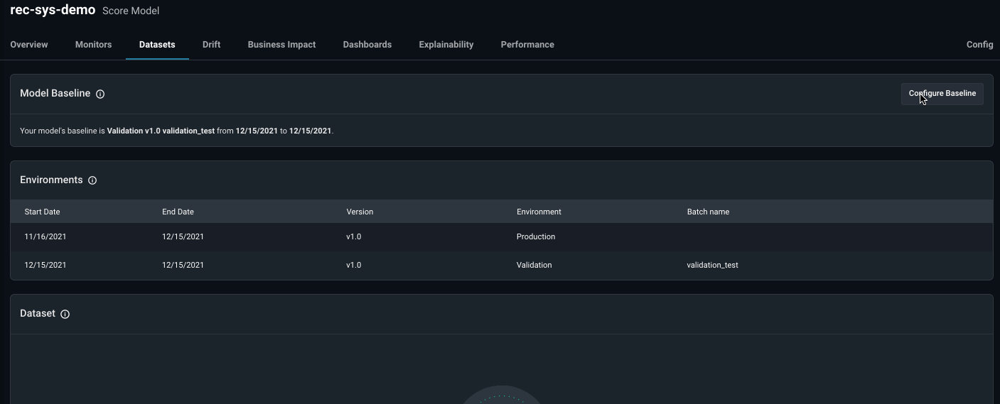

# Step 4. Monitoring

The inferences for this use case are the probabilities the user will play the recommended song. Once the recommendations are made for each user, the ground truth collected is an indicator as to whether or not the user listened to the song (or skipped the song) — represented as 0 (skipped) or 1 (played).

For example:

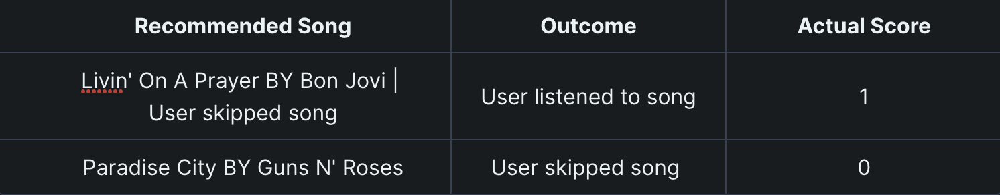


For a recommendation system will be using precision as our default performance metric to monitor model performance since precision is about retrieving the best items to the user (assuming that there are more useful items available).

Precision is the number of selected items that are relevant. So suppose our recommender system selects 3 items to recommend to users out of which 2 are relevant then precision will be 66%.

See equation:

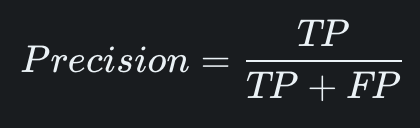

TP = song recommended + song played
FP = song recommended + song not played




## Configure Monitors
In just a few clicks, Arize automatically configures monitors that are best suited to your data to proactively detect drift, data quality, and performance issues. 

* Default Metric: Precision, Trigger Alert When: Precision is < .6, Positive Class: Played
* Turn On Monitoring: Drift ✅, Data Quality ✅, Performance ✅ 



# Step 5. Drift Detection 

Identify Model, Feature, and Actual Drift 
Visualize feature, model, and actual drift between various model environments and versions to identify fraud patterns, data quality issues, and anomalous distribution behavior. 

**For our recommendation system, anomalous distribution changes could be signs of issues depending on where they are happening. Arize provides drift over time widgets overlaid with your metric of choice (in our case, precision) to clearly determine if drift is contributing to our performance degradation.**

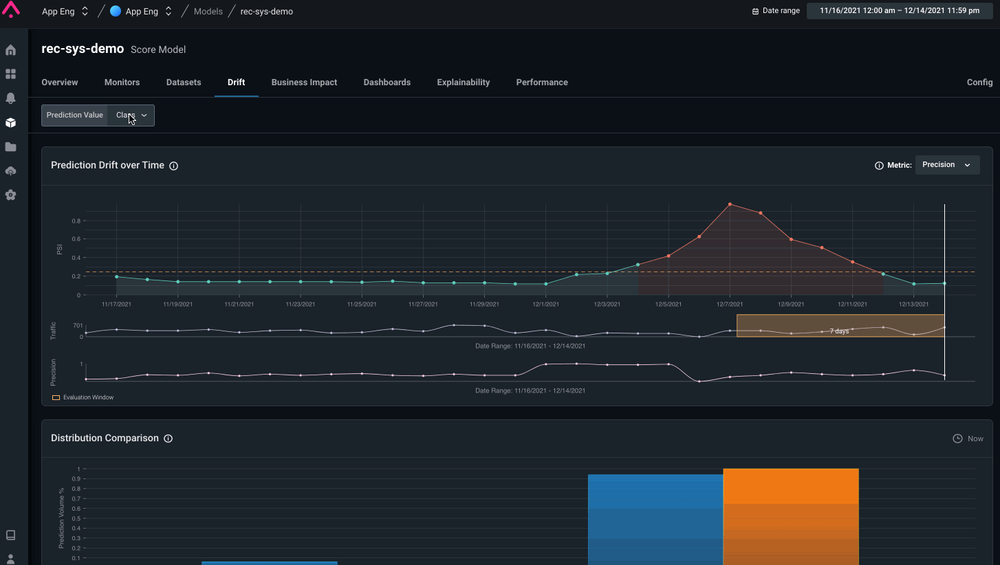


During initial model setup, Arize automatically created a set drift monitors and dashboards for each feature available in the dataset. Drift is mathematically defined as the Population Stability Index (PSI) over a given period, essentially it is a symmetric KL Divergence. We will use these graphs to monitor overall trends. 

From the model overview page, select the **Affiliate Provider** feature and you should notice the change in the distribution. Use the PSI graph to select a period of interest. We see that not has the expected amount of direct **links** has decreased in production, as well as a new input has been seen by the model. Notice that as the new affiliate provider **facebook** appears, the default threshold set by Arize was crossed, this is due to the feature drift being caused by inputs not used in the training baseline. At this point it might be a good time to train your model on the new input.

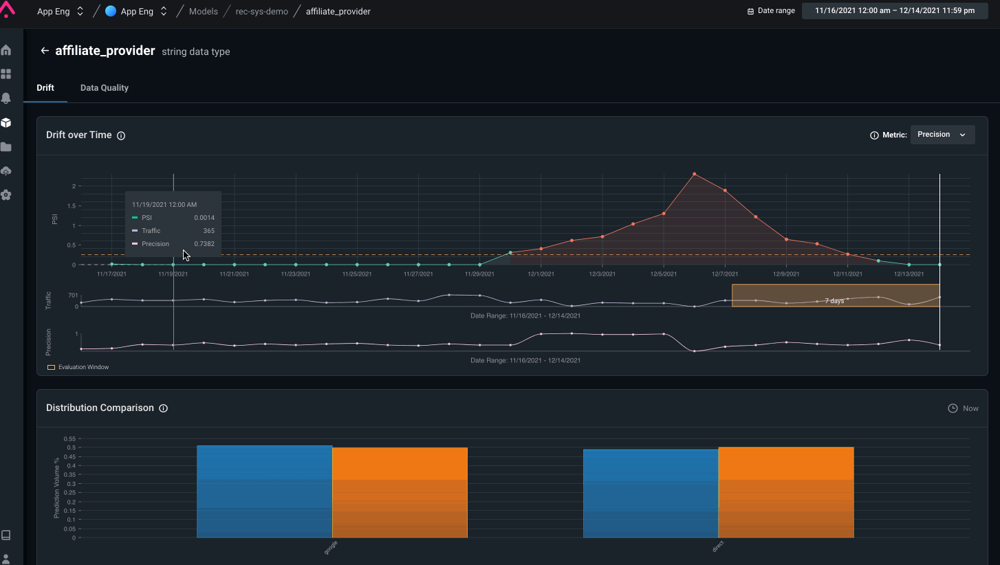

# Step 6. Data Quality Checks 

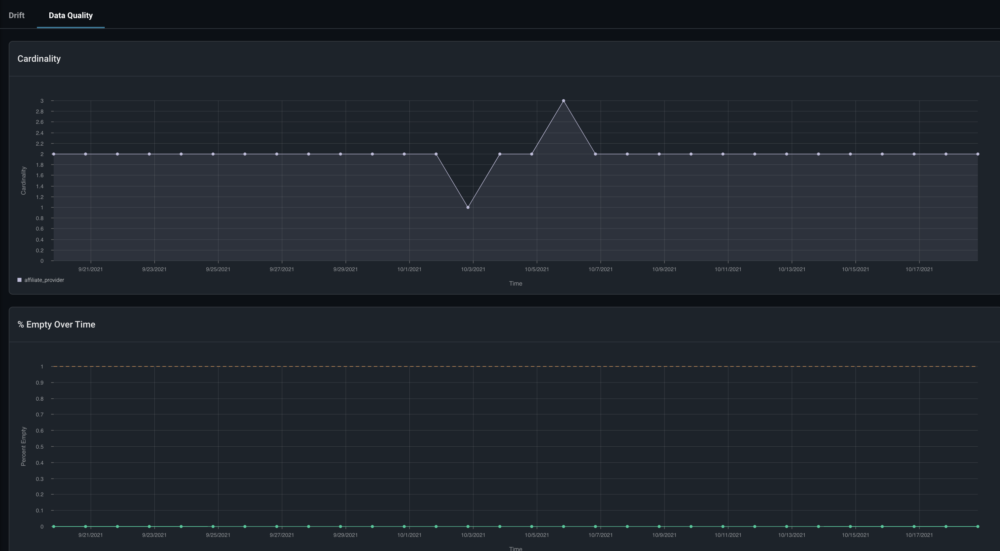



In the production data, values like **facebook** are being recorded against the **Affiliate Provider** feature that were not part of the training data. You already noticed some drift on the **Affiliate Provider** feature and you can further investigate by navigating to the Data Quality tab. Make sure to view the last 30 days by selecting the correct range in the top right corner of the screen. Arize keeps tracks of feature cardinality as well as fields with no data and can pin-point the exact time that this issue started.

You are also able to dive into data quality issues via model Overview tab. 

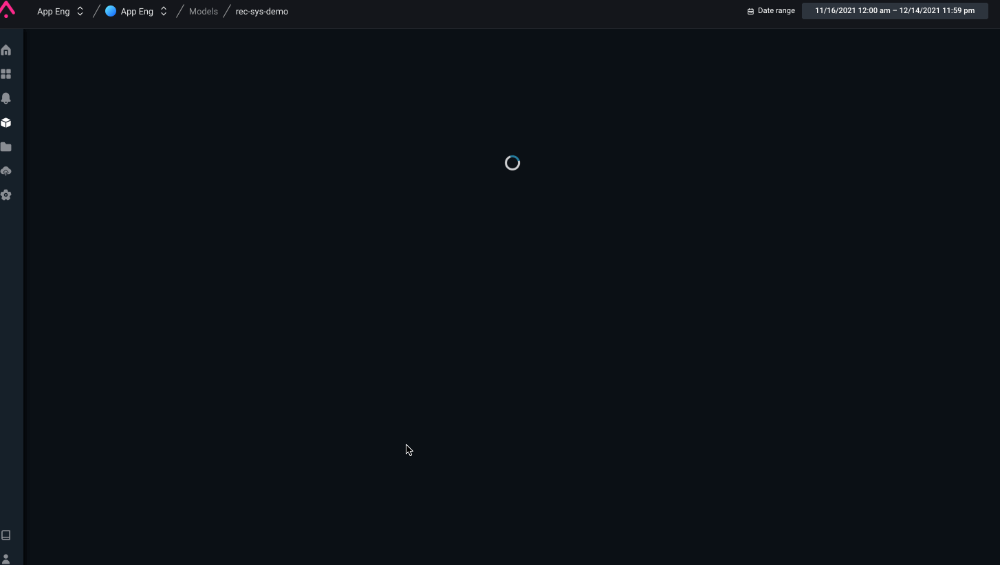

To automatically be notified of bad values getting introduced in production create custom monitor for your features. From the model Monitors tab click New Monitor and chose a monitor type (drift, performance, or data quality).

# Step 7. Performance Analysis 

Model performance metrics measure how well your model performs in production. Once a performance monitor is triggered, navigate to the Performance tab to start troubleshooting your model issues and gain an understanding of what caused the degradation. 

Compare production to training or other windows of production. Bring in another dataset to compare performance and see which model performs better. This can help answer questions such as "Were we seeing this problem in training?" or "Does my new / previous model version perform better?". It can also be helpful to compare to other windows of production.

**Identify low performing segments**. By looking at performance breakdown by feature, you can dig even deeper to see which segment within each feature of the model is underperforming. 

Here we are:
1. Checking the performance over time overlaid with volume. Precision ~76%
2. Analyzing the confusion matrix, calibration curve, and Performance impact score.
3. Observing Austin is having a very poor performance and very strong impact on the precision score.
4. Excluding Austin as a filter.
5. Demonstrating that by excluding Austin the overall performance in the production environment has increase to 83%

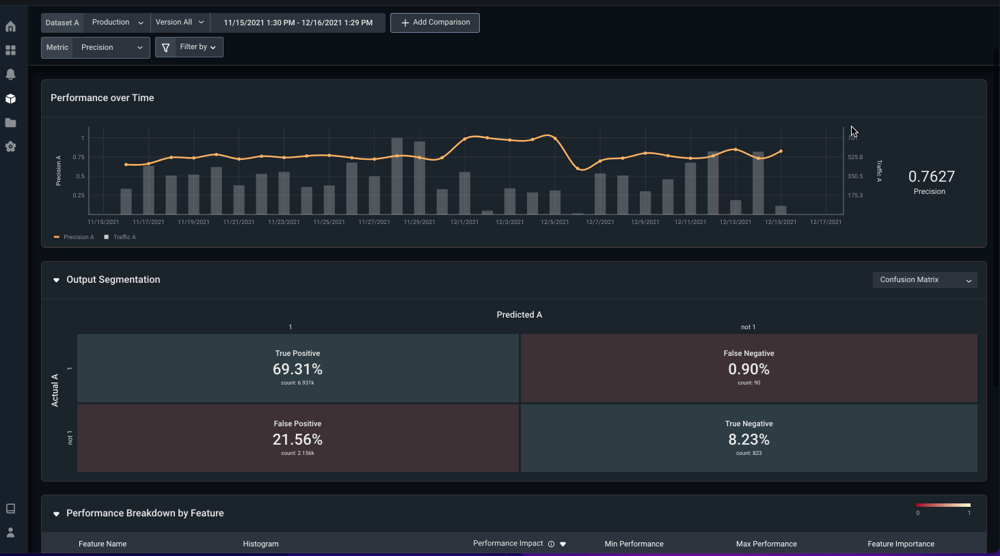


##Root cause analysis for low performing cohorts in template view 

When using the performance dashboards we have a 2D view of the data, when we use our Heatmap view we can take analysis a step future with a 3D view. We will now select templates on the left side bar, select Feature Performance Heatmap and fill out the template.  

The Feature Performance Heatmap provides you with model performance information across all features, at various feature/value combinations — also known as a slice. Feature Performance Heatmaps also support conditional filters.

This view has automatically identified the first step in improving overall model performance by improving the slices with the poorest performing predictions, which were in **Austin** with **Heavy Metal**, **Hard Rock**.  

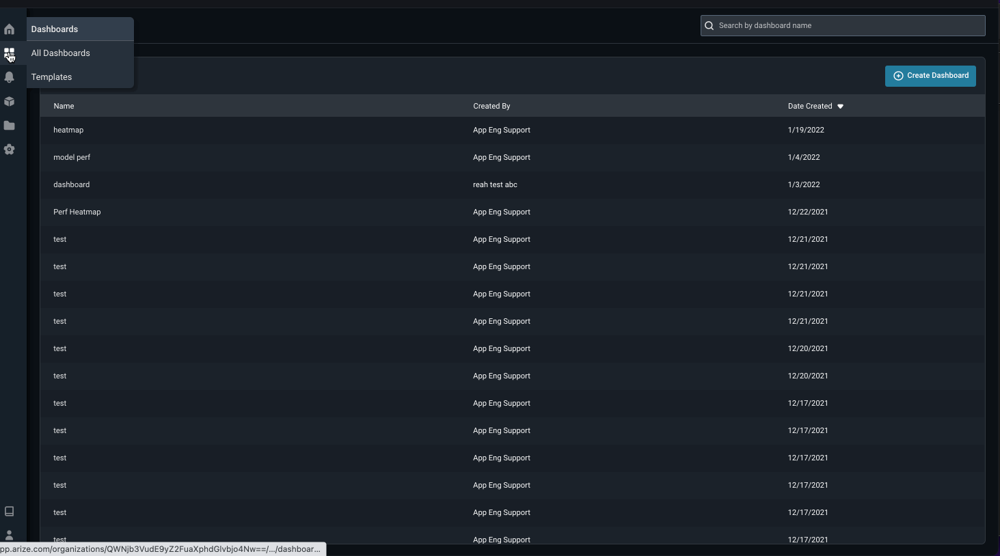

# Step 8. Custom Dashboard

Now that we have looked over data quality and feature drift, we will investigate model performance with Arize's performance dashboards for a single glance view of the model's important metrics. While you are able to fully customize dashboards for your team, we will use our Scored Model Performance Dashboard template from the template tab in the left-hand sidebar.

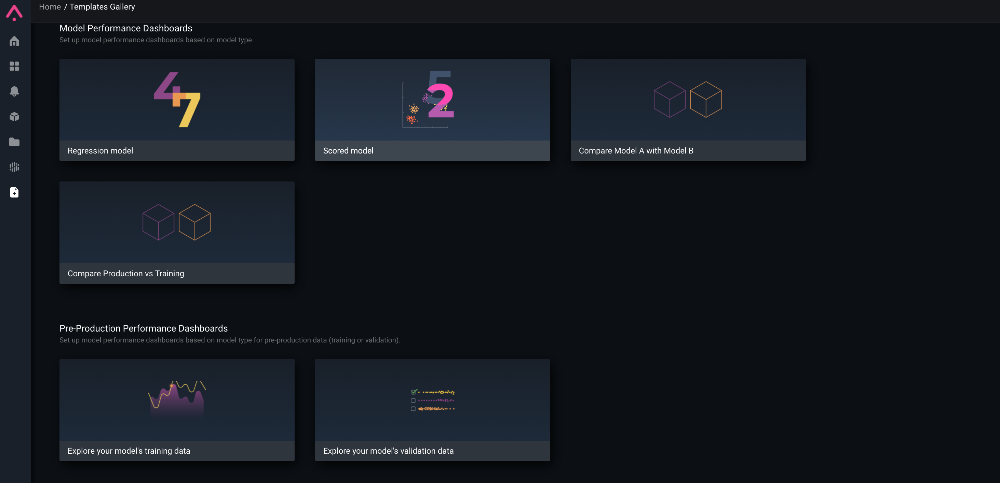

Dashboards are comprised of widgets designed for different types of analysis across your training, validation, and production environments:

* Distribution Widget for analyzing data distribution changes over Feature, Prediction, and Actuals.
* TimeSeries Widget for analyzing time-based data.
* Statistic Widget for getting an aggregate statistic. Data Metrics and Evaluation Metrics charts are also available for this widget.


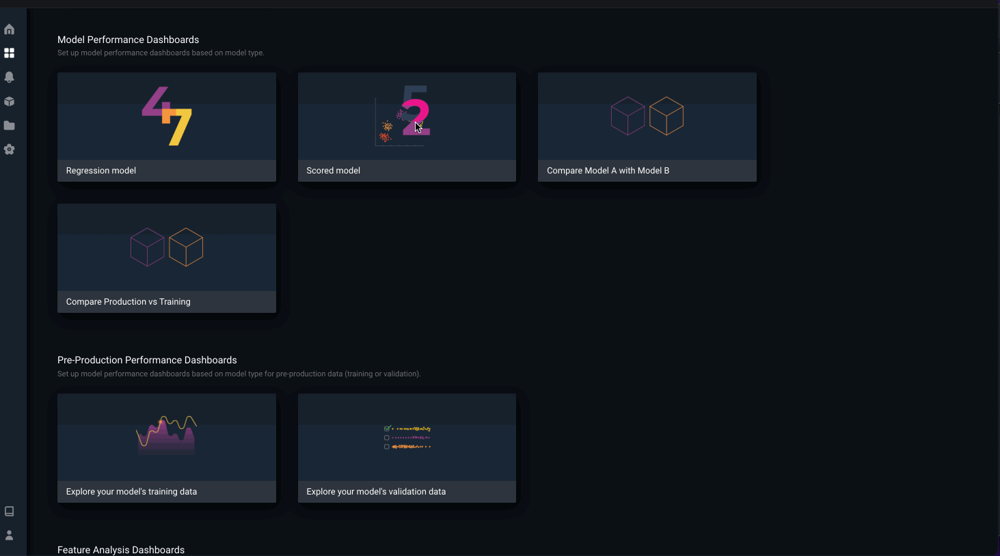




# Step 9. Explainability

Log feature importances to the Arize platform to explain your model's predictions. By logging these values, you gain the ability to view the global feature importances of your predictions as well as the ability to perform global and cohort prediction-based analysis to compare feature importances for your model's features.


# Step 10. Resources

Visit the Arize [Blog](https://arize.com/blog/) and [Resource Center](https://arize.com/resource-hub/) for more resources on ML observability and model monitoring.

